<a href="https://colab.research.google.com/github/yashpatle23/Final-Year-Project-GAN/blob/main/Skin_Cancer_GAN_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'skin-cancer-mnist-ham10000:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F54339%2F104884%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240926%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240926T181443Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3efe32fb8ae66ea1a90c80cd91cc64864cf8086dae37a53a937cee440983f643a90a286efff478da3f3f8781fa6f3553d7ba27e01e9c19852b5c34430719ccfa245594db05de9c1b6217ff88e25952ae45df8afcea7e5afce2da36bdc0fc6ccd1bcfd7b75c62074192f9edc1b98d5f805ae50601a7c52dddd688ff7957dc6b80dd63ce0258393ee096e5951ae1ed2991dda5cb3cc67eb75a27ec658772ad9cfdf0c1ba965004e2df65ab3e3e1dd67253a48f42fb3ca948095c2678f325c6749d554d796987b99052b103d763dc8db136093ce99d60a8063891787b8d803f5c900a60d5316177ffd6f10e8c28e2e96bae696cef1be4ba93aac6b5547a639d7f40'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 5582914511 bytes downloaded
Downloaded and uncompressed: skin-cancer-mnist-ham10000
Data source import complete.


# Import Libraries

In [2]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm.auto import tqdm


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Reshape,Conv2D , Conv2DTranspose , Dense , BatchNormalization , LeakyReLU , ReLU , Flatten
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    print("Name:", gpu.name, "  Type:", gpu.device_type)

Name: /physical_device:GPU:0   Type: GPU


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

# Data Pipeline

In [6]:
IMG_SIZE = 128
BATCH_SIZE = 128
BUFFER_SIZE = 1000
DATASET_DIR_1 = '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1'
DATASET_DIR_2 = '/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2'
paths = [DATASET_DIR_1,DATASET_DIR_2]

In [7]:
img_paths = []
for DATASET_DIR in tqdm(paths):
        for path in tqdm(os.listdir(DATASET_DIR )) :
                img_paths.append(DATASET_DIR+'/'+path)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5015 [00:00<?, ?it/s]

In [8]:
def map_fn(img_path ) :
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (IMG_SIZE , IMG_SIZE))
    img = tf.cast(img , tf.float32) / 255.
    return img

In [9]:
dataset = tf.data.Dataset.from_tensor_slices(img_paths)
dataset = dataset.map(map_fn)
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [10]:
print(f"the size of the dataloader {len(dataset)} batches of {BATCH_SIZE}")

the size of the dataloader 79 batches of 128


In [11]:
img_sample = next(iter(dataset))
img_sample.shape

TensorShape([128, 128, 128, 3])

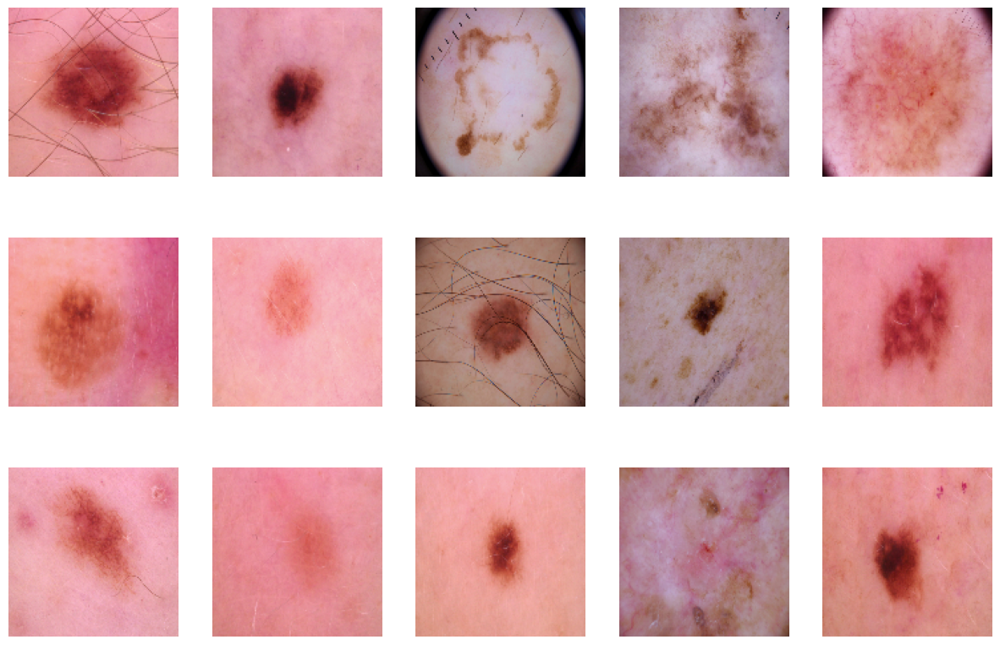

In [12]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    img = img_sample[i].numpy()
    ax.imshow(img)
    ax.axis('off')

# **Build our model**

## **The Discriminator**

In [13]:
discriminator = Sequential([
    Input(shape = (IMG_SIZE , IMG_SIZE , 3)) ,
    Conv2D(64 , kernel_size = 4 , strides = 2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    LeakyReLU(0.2) ,

    Conv2D(128 , kernel_size = 4 , strides = 2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    LeakyReLU(0.2) ,

    Conv2D(256 , kernel_size = 4 , strides = 2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    LeakyReLU(0.2) ,

    Conv2D(512 , kernel_size = 4 , strides = 2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    LeakyReLU(0.2) ,

    Flatten() ,
    Dense(1 , activation = 'sigmoid' , use_bias=False)
])

In [14]:
discriminator.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │           3,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │          32,768 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,792,192 (10.65 MB)

 Trainable params: 2,790,272 (10.64 MB)

 Non-trainable params: 1,920 (7.50 KB)

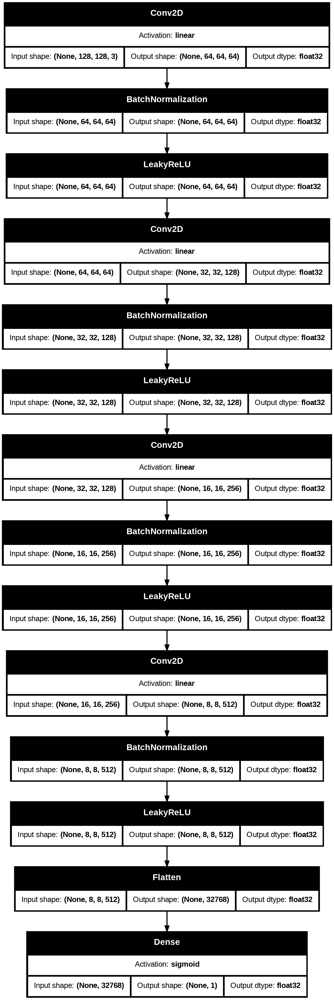

In [15]:
plot_model(model=discriminator,to_file='Discriminator Model.png',show_shapes=True,show_dtype=True,show_layer_activations=True)

## **The Generator**

In [16]:
Z_DIM = 128

In [17]:
generator = Sequential([
    Dense(8*8*512, use_bias=False, input_shape=(Z_DIM,)),
    BatchNormalization() ,
    ReLU() ,
    Reshape((8,8,512)) ,

    Conv2DTranspose(256 , kernel_size = 4 , strides=2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    ReLU() ,

    Conv2DTranspose(128 , kernel_size = 4 , strides=2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    ReLU() ,

    Conv2DTranspose(64 , kernel_size = 4 , strides=2 , padding = 'same' , use_bias=False) ,
    BatchNormalization() ,
    ReLU() ,

    Conv2DTranspose(3 , kernel_size = 4 , strides=2 , padding = 'same' , activation= 'tanh' , use_bias=False) ,
])

In [18]:
generator.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 32768)               │       4,194,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 32768)               │         131,072 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 256)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 128, 128, 3)         │           3,072 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,082,752 (27.02 MB)

 Trainable params: 7,016,320 (26.77 MB)

 Non-trainable params: 66,432 (259.50 KB)

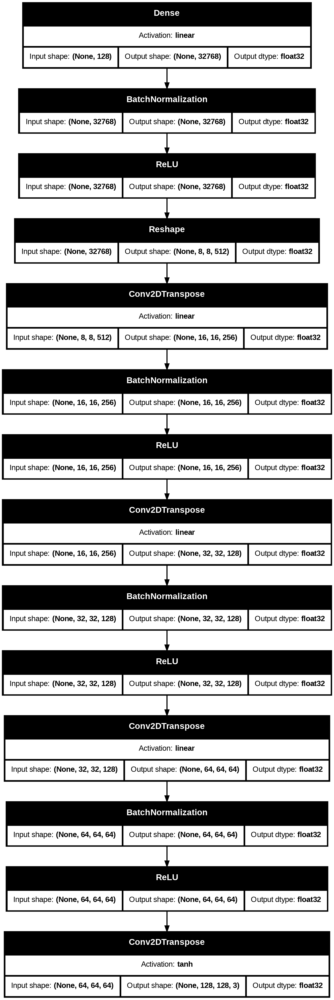

In [19]:
plot_model(model=generator,to_file='Generator Model.png',show_shapes=True,show_dtype=True,show_layer_activations=True)

# Loss and optimizers

In [20]:
gen_optimizer = Adam(learning_rate=0.0002 , beta_1=0.5 , beta_2=0.999)
disc_optimizer = Adam(learning_rate=0.0002 , beta_1=0.5 , beta_2=0.999)
criterion = BinaryCrossentropy(from_logits=True)

# Train our model

In [21]:
Epochs = 60

In [22]:
def show_images() :
    noise = tf.random.normal([BATCH_SIZE , Z_DIM])
    preds = generator(noise , training = False)
#     fig = plt.figure(figsize=(8,8))
#     for i in range(16):
#         img = preds[i].numpy()
#         img = np.clip(img,0,1)
#         ax.imshow(img)
#         ax.axis('off')
#     plt.savefig('gan_generated_images.png')
# #     plt.imshow()
#     plt.show()
    fig, axis = plt.subplots(3, 5, figsize=(15, 10))
    for i, ax in enumerate(axis.flat):
        img = preds[i].numpy()
        img = np.clip(img,0,1)
        ax.imshow(img)
        ax.axis('off')
    plt.savefig('gan_generated_images.png')
    plt.show()

In [23]:
def discriminator_loss(real_output , fake_output) :
    real_loss = criterion(tf.ones_like(real_output) , real_output)
    fake_loss = criterion(tf.zeros_like(fake_output) , fake_output)

    total_loss = real_loss + fake_loss

    return total_loss

def generator_loss(fake_output) :
    return criterion(tf.ones_like(fake_output) , fake_output)

In [24]:
@tf.function
def train_step(images) :
    noise = tf.random.normal([BATCH_SIZE , Z_DIM])
    with tf.GradientTape() as gen_tape , tf.GradientTape() as disc_tape :
        fake_images = generator(noise , training = True)

        real_output = discriminator(images , training = True)
        fake_output = discriminator(fake_images , training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output , fake_output)

    gen_gradients = gen_tape.gradient(gen_loss , generator.trainable_variables)
    disc_gradients = disc_tape.gradient(disc_loss , discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gen_gradients , generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_gradients , discriminator.trainable_variables))

    return gen_loss , disc_loss

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 1  , Generator Loss : 17.322162628173828 , Discriminator Loss : 0.16466213762760162



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 2  , Generator Loss : 10.434738159179688 , Discriminator Loss : 0.6507781744003296



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 3  , Generator Loss : 4.617907524108887 , Discriminator Loss : 0.36760786175727844



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 4  , Generator Loss : 4.363595962524414 , Discriminator Loss : 0.7819830775260925



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 5  , Generator Loss : 2.5051355361938477 , Discriminator Loss : 0.7569767832756042



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 6  , Generator Loss : 2.765004873275757 , Discriminator Loss : 0.6372117400169373



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 7  , Generator Loss : 2.9087157249450684 , Discriminator Loss : 0.6718476414680481



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 8  , Generator Loss : 2.9823336601257324 , Discriminator Loss : 0.7926577925682068



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 9  , Generator Loss : 3.0316321849823 , Discriminator Loss : 0.6879029273986816



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 10  , Generator Loss : 2.979334831237793 , Discriminator Loss : 0.8379517793655396



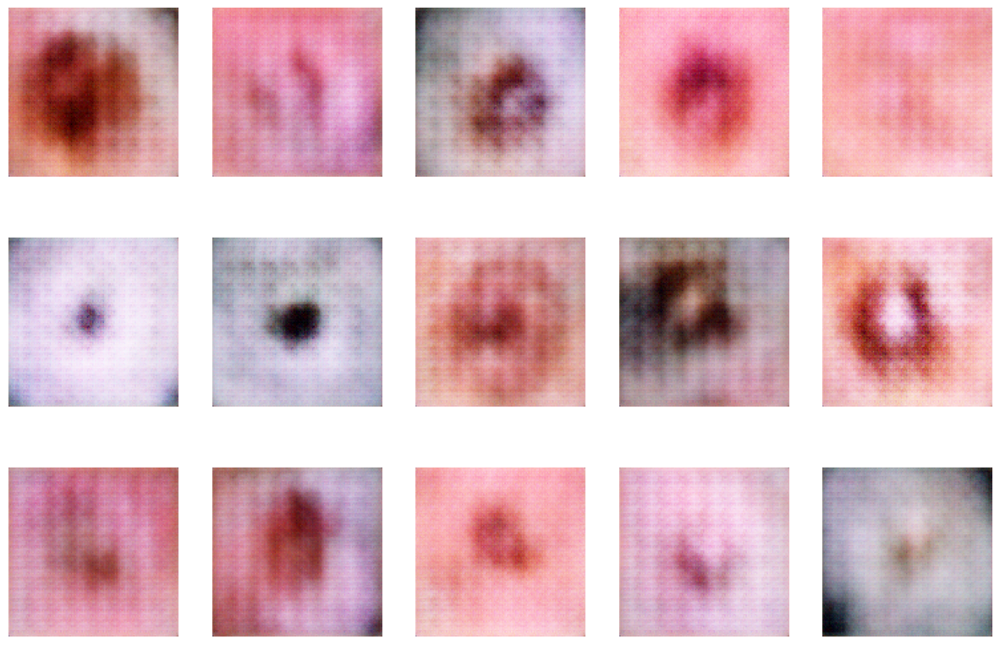

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 11  , Generator Loss : 2.758251428604126 , Discriminator Loss : 0.8445649743080139



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 12  , Generator Loss : 2.8439722061157227 , Discriminator Loss : 0.8897930383682251



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 13  , Generator Loss : 3.3088958263397217 , Discriminator Loss : 0.7197052836418152



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 14  , Generator Loss : 3.168771982192993 , Discriminator Loss : 0.9006583094596863



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 15  , Generator Loss : 3.5432441234588623 , Discriminator Loss : 0.626543402671814



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 16  , Generator Loss : 4.2951202392578125 , Discriminator Loss : 0.8970432281494141



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 17  , Generator Loss : 2.9067468643188477 , Discriminator Loss : 0.7161665558815002



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 18  , Generator Loss : 3.577263116836548 , Discriminator Loss : 0.8005902171134949



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 19  , Generator Loss : 3.3655595779418945 , Discriminator Loss : 0.6710163354873657



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 20  , Generator Loss : 3.6988282203674316 , Discriminator Loss : 0.8110591769218445



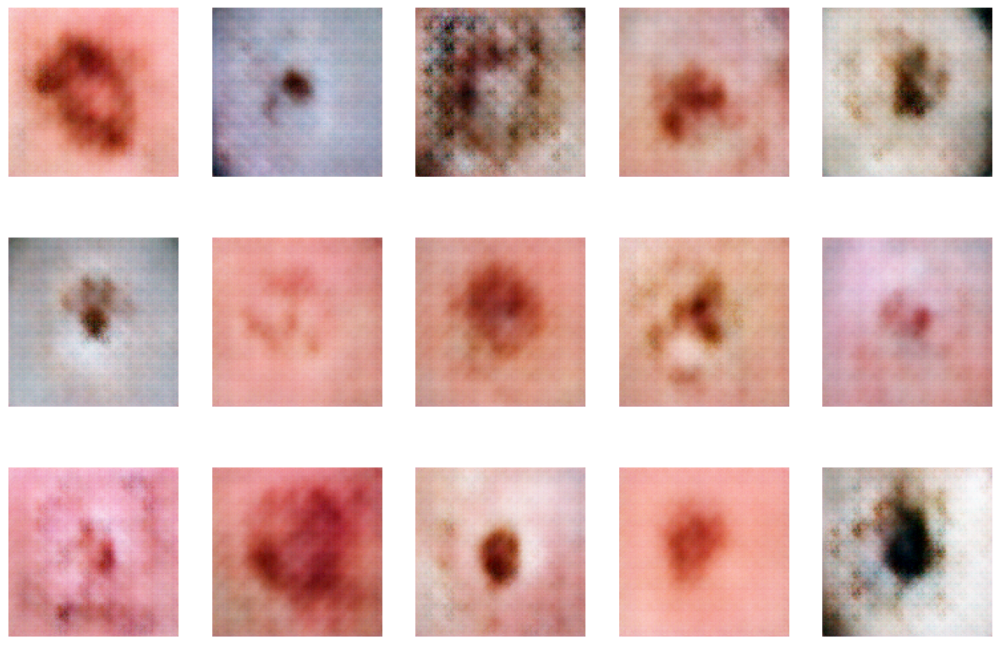

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 21  , Generator Loss : 3.6817502975463867 , Discriminator Loss : 0.6450911164283752



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 22  , Generator Loss : 4.129262924194336 , Discriminator Loss : 0.5715454816818237



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 23  , Generator Loss : 4.159343242645264 , Discriminator Loss : 0.7128835320472717



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 24  , Generator Loss : 4.5766706466674805 , Discriminator Loss : 0.5868045091629028



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 25  , Generator Loss : 5.003061294555664 , Discriminator Loss : 0.4822463095188141



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 26  , Generator Loss : 5.056546211242676 , Discriminator Loss : 0.6114835143089294



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 27  , Generator Loss : 4.612651348114014 , Discriminator Loss : 0.5961393713951111



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 28  , Generator Loss : 3.8757073879241943 , Discriminator Loss : 0.5477819442749023



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 29  , Generator Loss : 4.893241882324219 , Discriminator Loss : 0.5961524844169617



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 30  , Generator Loss : 4.13824462890625 , Discriminator Loss : 0.6604171991348267



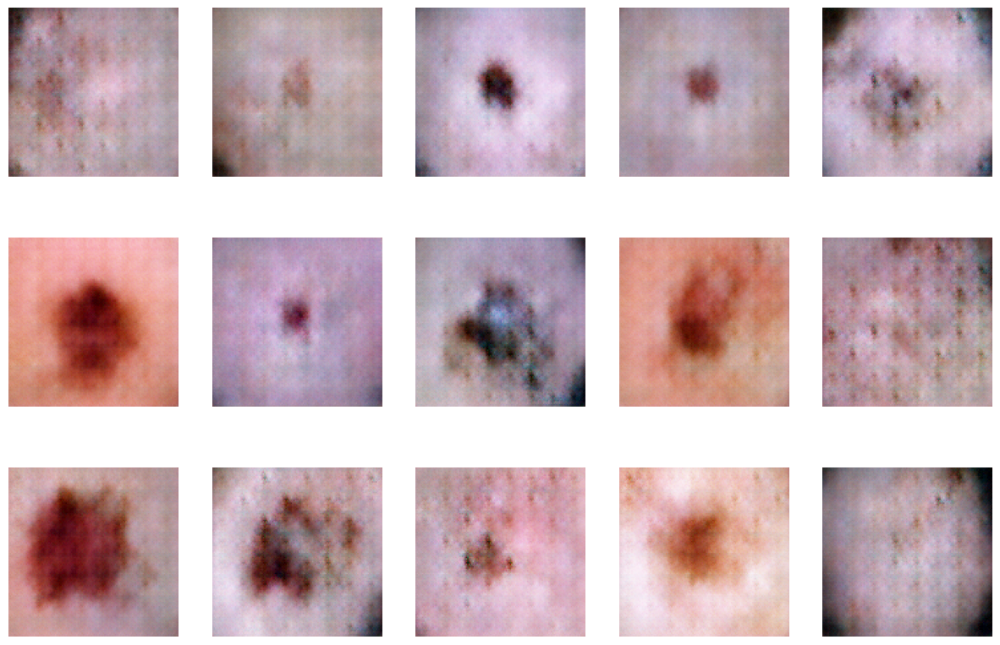

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 31  , Generator Loss : 5.225028991699219 , Discriminator Loss : 0.447553426027298



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 32  , Generator Loss : 4.251916885375977 , Discriminator Loss : 0.6750985383987427



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 33  , Generator Loss : 5.180822849273682 , Discriminator Loss : 0.5163517594337463



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 34  , Generator Loss : 5.012810230255127 , Discriminator Loss : 0.4077286124229431



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 35  , Generator Loss : 4.894825458526611 , Discriminator Loss : 0.5011008977890015



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 36  , Generator Loss : 4.438632488250732 , Discriminator Loss : 0.5552550554275513



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 37  , Generator Loss : 4.506938457489014 , Discriminator Loss : 0.44597741961479187



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 38  , Generator Loss : 4.807500839233398 , Discriminator Loss : 0.566866934299469



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 39  , Generator Loss : 5.184821128845215 , Discriminator Loss : 0.36469608545303345



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 40  , Generator Loss : 5.41092586517334 , Discriminator Loss : 0.40489545464515686



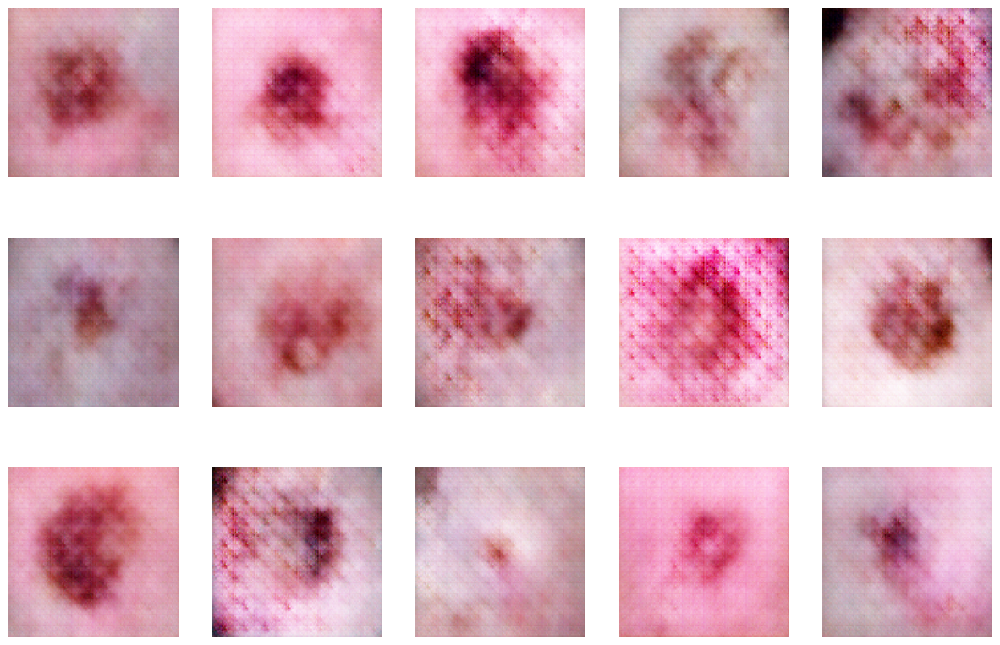

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 41  , Generator Loss : 5.191551685333252 , Discriminator Loss : 0.3401491641998291



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 42  , Generator Loss : 4.986494064331055 , Discriminator Loss : 0.491210401058197



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 43  , Generator Loss : 4.802143096923828 , Discriminator Loss : 0.4633963406085968



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 44  , Generator Loss : 4.735358715057373 , Discriminator Loss : 0.44212934374809265



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 45  , Generator Loss : 4.32977819442749 , Discriminator Loss : 0.4931938648223877



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 46  , Generator Loss : 5.733801364898682 , Discriminator Loss : 0.2846507430076599



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 47  , Generator Loss : 4.546687126159668 , Discriminator Loss : 0.6431028842926025



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 48  , Generator Loss : 5.720667362213135 , Discriminator Loss : 0.3698349893093109



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 49  , Generator Loss : 5.622420310974121 , Discriminator Loss : 0.2714258134365082



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 50  , Generator Loss : 5.708195686340332 , Discriminator Loss : 0.534328281879425



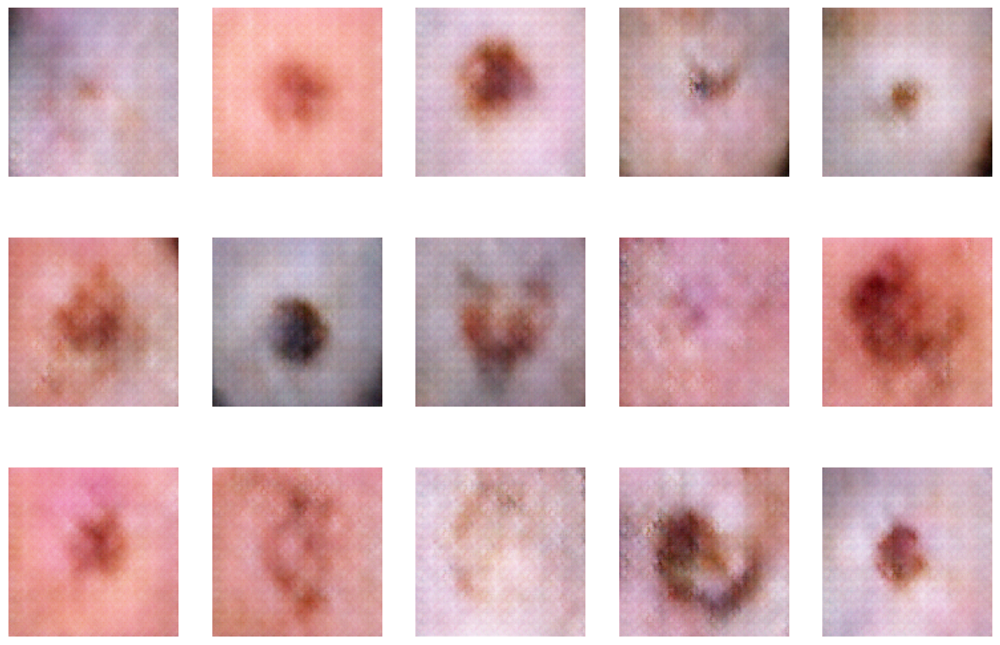

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 51  , Generator Loss : 4.687598705291748 , Discriminator Loss : 0.3555445671081543



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 52  , Generator Loss : 6.215423107147217 , Discriminator Loss : 0.31921151280403137



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 53  , Generator Loss : 4.936404228210449 , Discriminator Loss : 0.5178770422935486



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 54  , Generator Loss : 5.608685493469238 , Discriminator Loss : 0.4280620515346527



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 55  , Generator Loss : 5.723442554473877 , Discriminator Loss : 0.39264604449272156



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 56  , Generator Loss : 5.8098273277282715 , Discriminator Loss : 0.4278603196144104



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 57  , Generator Loss : 6.351559638977051 , Discriminator Loss : 0.3983476758003235



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 58  , Generator Loss : 5.8933424949646 , Discriminator Loss : 0.2009432166814804



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 59  , Generator Loss : 5.681291103363037 , Discriminator Loss : 0.31746765971183777



  0%|          | 0/79 [00:00<?, ?it/s]

Epoch : 60  , Generator Loss : 5.678199768066406 , Discriminator Loss : 0.34612804651260376



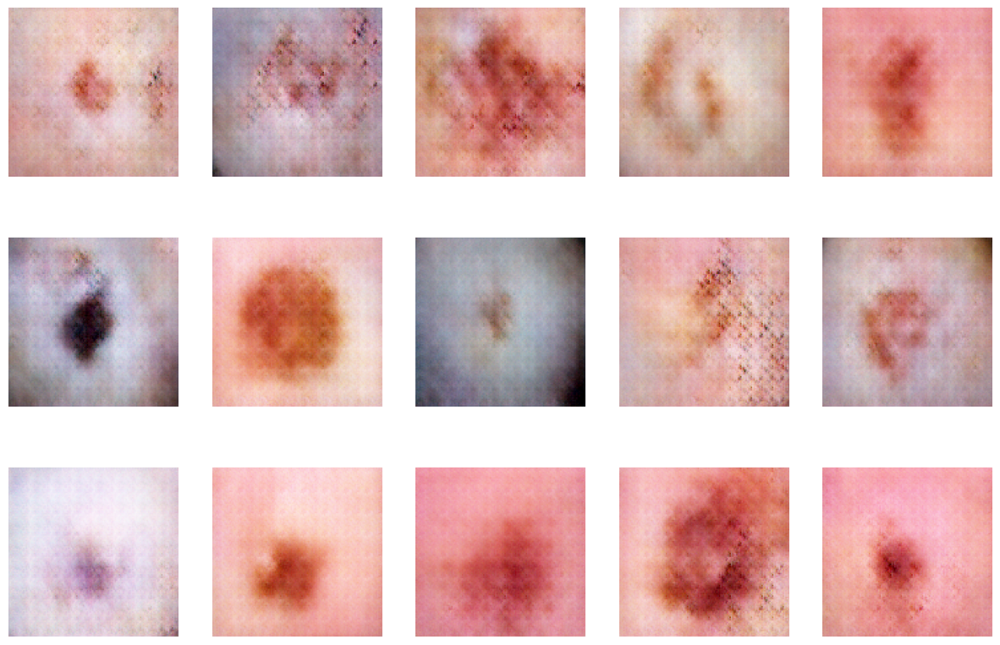

In [25]:
with tf.device("/GPU:0") :
    disc_losses = []
    gen_losses = []
    for i in tqdm(range(Epochs)) :
        epoch_disc_loss = []
        epoch_gen_loss = []
        for image  in tqdm(dataset) :
            gen_loss , disc_loss = train_step(image)
            epoch_disc_loss.append(disc_loss)
            epoch_gen_loss.append(gen_loss)
        disc_losses.append(np.mean(epoch_disc_loss))
        gen_losses.append(np.mean(epoch_gen_loss))
        print(f"Epoch : {i+1}  , Generator Loss : {gen_losses[-1]} , Discriminator Loss : {disc_losses[-1]}\n")
        if (i+1) % 10 == 0 :
            show_images()

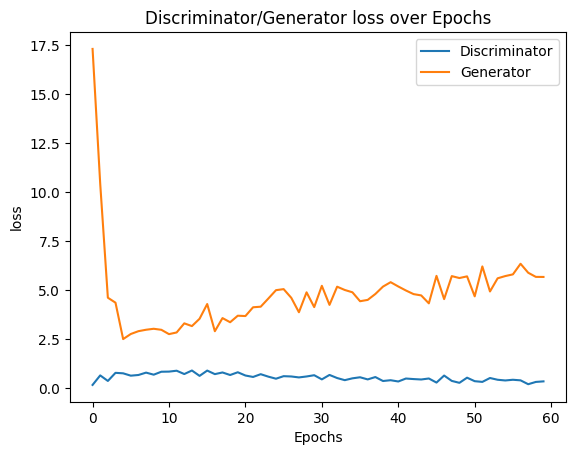

In [26]:
plt.plot(disc_losses , label='Discriminator')
plt.plot(gen_losses , label='Generator')
plt.title('Discriminator/Generator loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

# Save our model

In [27]:
generator.save('Skin_Cancer_Generator.h5')
discriminator.save('Skin_Cancer_Discriminator.h5')

In [28]:
generator.load_weights(os.path.join('archive', '/content/Skin_Cancer_Generator.h5'))

In [29]:
imgs = generator.predict(tf.random.normal((16, 128, 1)))

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


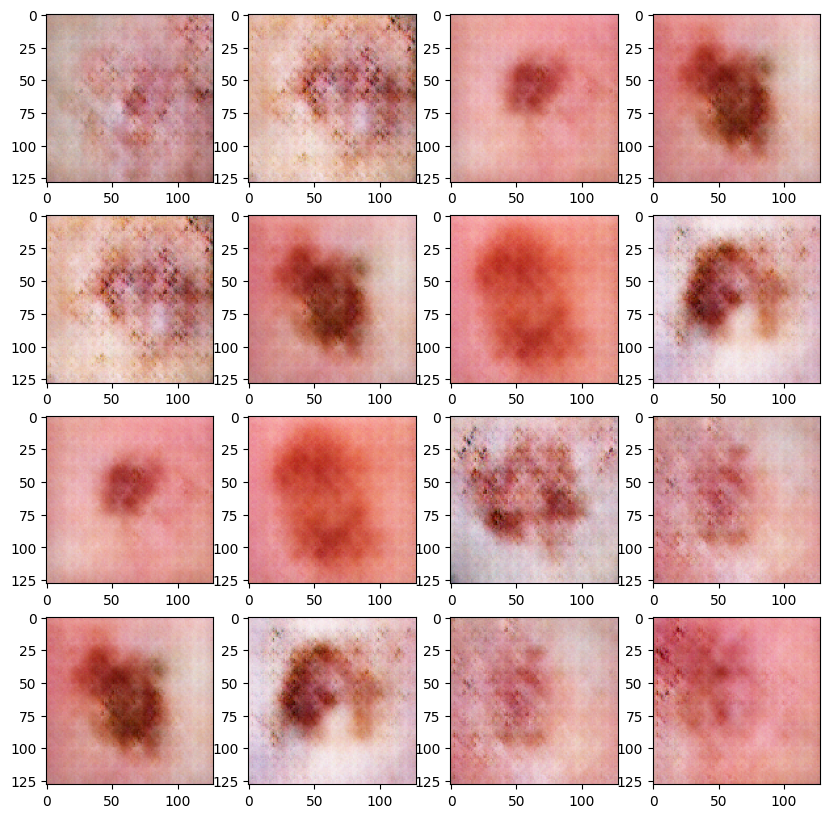

In [30]:
# prompt: fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(10,10))
# for r in range(4):
#     for c in range(4):
#         ax[r][c].imshow(imgs[(r+1)*(c+1)-1])
# save fig with name generated_images png

import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(10,10))
for r in range(4):
    for c in range(4):
        ax[r][c].imshow(imgs[(r+1)*(c+1)-1])
plt.savefig('generated_images.png')
